In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import random
from random import sample, getrandbits
import keras
from keras.utils import HDF5Matrix

import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image, ImageFilter, ImageEnhance 

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os

# Any results you write to the current directory are saved as output.

Using TensorFlow backend.


In [2]:
# Import dataset
# x_train = HDF5Matrix('../input/camelyonpatch_level_2_split_train_x.h5-002/camelyonpatch_level_2_split_train_x.h5-002', 'x')
# mask_train = HDF5Matrix('../input/camelyonpatch_level_2_split_train_mask.h5/camelyonpatch_level_2_split_train_mask.h5', 'mask')
# y_train = HDF5Matrix('../input/camelyonpatch_level_2_split_train_y.h5/camelyonpatch_level_2_split_train_y.h5', 'y')               
# x_val = HDF5Matrix('../input/camelyonpatch_level_2_split_valid_x.h5/camelyonpatch_level_2_split_valid_x.h5', 'x')
# y_val = HDF5Matrix('../input/camelyonpatch_level_2_split_valid_y.h5/camelyonpatch_level_2_split_valid_y.h5', 'y')
x_test = HDF5Matrix('../input/camelyonpatch_level_2_split_test_x.h5/camelyonpatch_level_2_split_test_x.h5', 'x')

In [3]:
from utils.load_data import load_data

In [4]:
x_test, y_test_true = load_data('data/macenko/', purpose='test', norm='macenko')

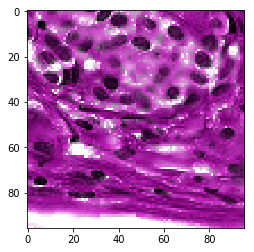

In [5]:
image = x_test[1992]
plt.imshow(image)
plt.show()

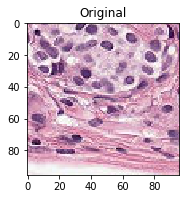

In [6]:
plt.subplot(121)
plt.imshow(image)
plt.title('Original')
plt.show()

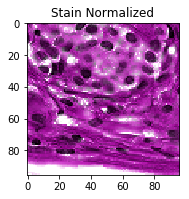

In [10]:

plt.subplot(121)
plt.imshow(image)
plt.title('Stain Normalized')
plt.show()

## #Basic

### 90 rotations

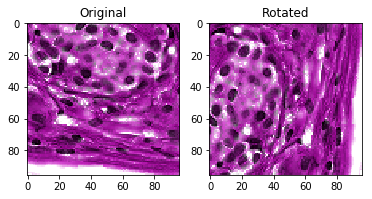

In [34]:
angles=[0, 90]
angle = sample(angles, 1)
im = Image.fromarray(image)
im = im.rotate(angle=90)
image_rotated = np.array(im)

plt.subplot(121)
plt.imshow(image)
plt.title('Original')
plt.subplot(122)
plt.imshow(image_rotated)
plt.title('Rotated')
plt.show()

## Mirroring

In [10]:
def mirroring(image):
    a = getrandbits(2)
    if a == 3:
        im_aug = np.fliplr(np.flipud(image))
    elif a == 2:
        im_aug = np.flipud(image)
    elif a == 1:
        im_aug = np.fliplr(image)
    else:
        im_aug = image
    return im_aug

Text(0.5, 1.0, 'Mirrored')

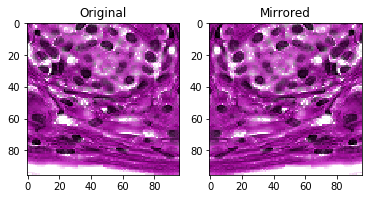

In [33]:
im_lr = np.fliplr(image)
im_ud = np.flipud(image)
im_lr_ud = np.flipud(np.fliplr(image))
im_ud_lr = np.fliplr(np.flipud(image))

plt.subplot(121)
plt.imshow(image)
plt.title('Original')
plt.subplot(122)
plt.imshow(im_lr)
plt.title('Mirrored')


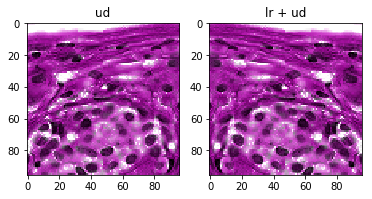

In [13]:
plt.subplot(121)
plt.imshow(im_ud)
plt.title('ud')
plt.subplot(122)
plt.imshow(im_lr_ud)
plt.title('lr + ud')
plt.show()


## #Morphological trasformation

### Elastic transformation (Simard et al 2003) [https://gist.github.com/chsasank/4d8f68caf01f041a6453e67fb30f8f5a](http://)

In [14]:
import numpy as np
from scipy.ndimage.interpolation import map_coordinates
from scipy.ndimage.filters import gaussian_filter

def elastic_transform(image, alpha, sigma, random_state=None):
    """Elastic deformation of images as described in [Simard2003]_.
    .. [Simard2003] Simard, Steinkraus and Platt, "Best Practices for
       Convolutional Neural Networks applied to Visual Document Analysis", in
       Proc. of the International Conference on Document Analysis and
       Recognition, 2003.
    """
    assert len(image.shape)==3

    if random_state is None:
        random_state = np.random.RandomState(None)

    shape_2d = image[:,:,0].shape

    dx = gaussian_filter((random_state.rand(*shape_2d) * 2 - 1), sigma, mode="constant", cval=0) * alpha
    dy = gaussian_filter((random_state.rand(*shape_2d) * 2 - 1), sigma, mode="constant", cval=0) * alpha

    x, y = np.meshgrid(np.arange(shape_2d[0]), np.arange(shape_2d[1]), indexing='ij')
    indices = np.reshape(x+dx, (-1, 1)), np.reshape(y+dy, (-1, 1))
    
    r = map_coordinates(image[:,:,0], indices, order=1).reshape(shape_2d)
    g = map_coordinates(image[:,:,1], indices, order=1).reshape(shape_2d)
    b = map_coordinates(image[:,:,2], indices, order=1).reshape(shape_2d)
   
    return np.stack((r,g,b), axis=2)

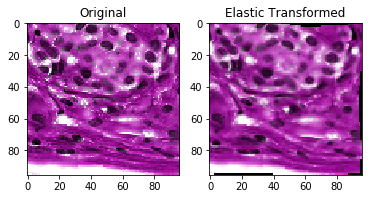

In [32]:
image_r_augm = elastic_transform(image, 80, 10)

plt.subplot(121)
plt.imshow(image)
plt.title('Original')
plt.subplot(122)
plt.imshow(image_r_augm)
plt.title('Elastic Transformed')
plt.show()

### Gaussian blurring

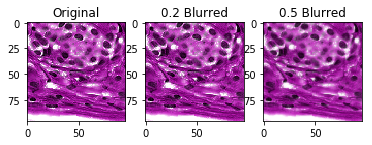

In [31]:
im = Image.fromarray(image)
out = im.filter(ImageFilter.GaussianBlur(0.2))
out = np.array(out)

out2 = im.filter(ImageFilter.GaussianBlur(0.5))
out2 = np.array(out2)


plt.subplot(131)
plt.imshow(image)
plt.title('Original')

plt.subplot(132)
plt.imshow(out)
plt.title('0.2 Blurred')
plt.subplot(133)
plt.imshow(out2)
plt.title('0.5 Blurred')
plt.show()

### Gaussian Noise

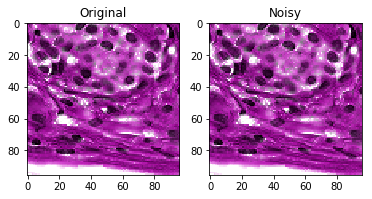

In [28]:
import numpy as np
import cv2
img = image
mean = 0
var = 10
sigma = 0.1

def gaussian_noise(image, sigma):
    gaussian = np.random.normal(mean, sigma, image[:,:,0].shape)
    noisy_image = np.zeros(img.shape, np.float32)

    if len(img.shape) == 2:
        noisy_image = img + gaussian
    else:
        noisy_image[:, :, 0] = img[:, :, 0] + gaussian
        noisy_image[:, :, 1] = img[:, :, 1] + gaussian
        noisy_image[:, :, 2] = img[:, :, 2] + gaussian

    cv2.normalize(noisy_image, noisy_image, 0, 255, cv2.NORM_MINMAX, dtype=-1)
    noisy_image = noisy_image.astype(np.uint8)
    
    return noisy_image

out = gaussian_noise(image, sigma)

plt.subplot(121)
plt.imshow(image)
plt.title('Original')
plt.subplot(122)
plt.imshow(out)
plt.title('Noisy')
plt.show()

## #Brightness & contrast (BC)

### Brightness

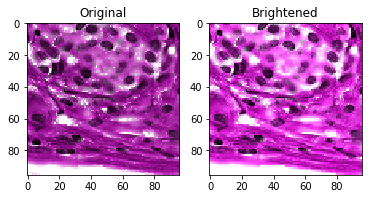

In [6]:
im = Image.fromarray(image)
enhancer = ImageEnhance.Brightness(im)
enhanced_im = enhancer.enhance(1.35)
out = np.array(enhanced_im)

plt.subplot(121)
plt.imshow(image)
plt.title('Original')
plt.subplot(122)
plt.imshow(out)
plt.title('Brightened')
plt.show()

### Contrast

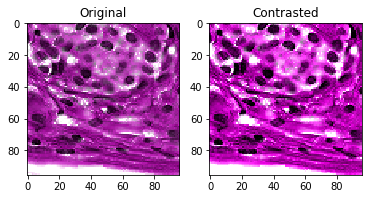

In [8]:
im = Image.fromarray(image)
enhancer = ImageEnhance.Contrast(im)
enhanced_im = enhancer.enhance(1.5)
out = np.array(enhanced_im)

plt.subplot(121)
plt.imshow(image)
plt.title('Original')
plt.subplot(122)
plt.imshow(out)
plt.title('Contrasted')
plt.show()

## #HSV

In [20]:
from skimage.color import rgb2hsv, hsv2rgb

def hsv_shifting(image, ratio):
    hsv_im = rgb2hsv(image)
    
    a = np.random.uniform(low= 1-ratio, high= 1+ratio, size=1)[0]
    b = np.random.uniform(low= -ratio, high= ratio, size=1)[0]
    
    hsv_im[:,:,0] = a * hsv_im[:,:,0] + b
    hsv_im[:,:,1] = a * hsv_im[:,:,1] + b
    
    
    new_im = hsv2rgb(hsv_im)
    
    return new_im

W0616 23:02:46.092496 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


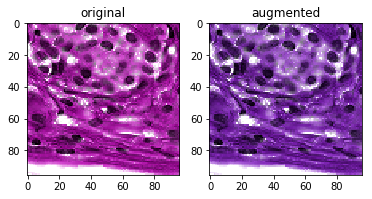

W0616 23:02:46.237869 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


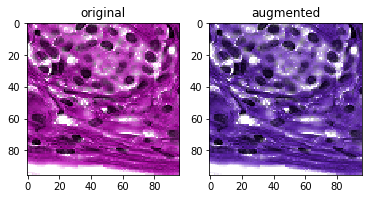

W0616 23:02:46.384063 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


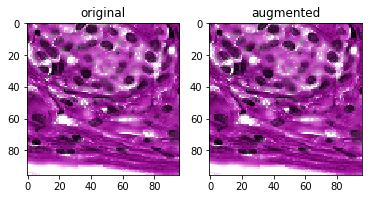

W0616 23:02:46.524766 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


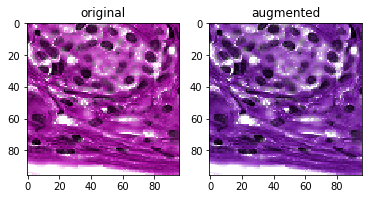

W0616 23:02:46.668432 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


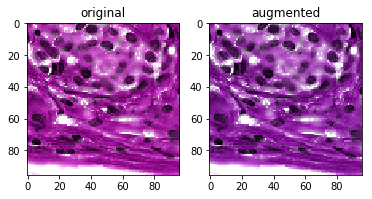

W0616 23:02:46.814428 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


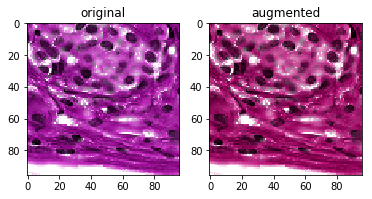

W0616 23:02:46.958651 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


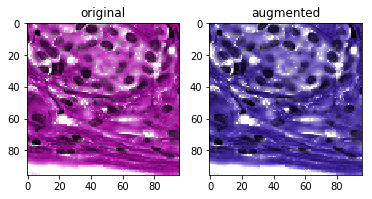

W0616 23:02:47.101601 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


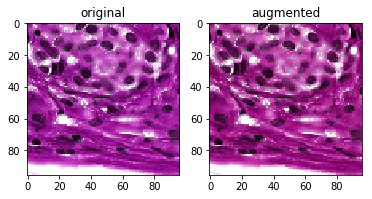

W0616 23:02:47.257865 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


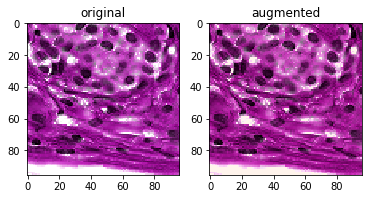

W0616 23:02:47.397882 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


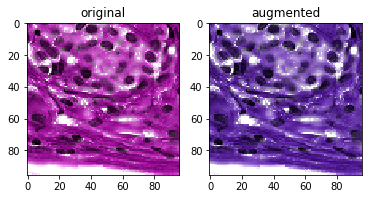

W0616 23:02:47.547677 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


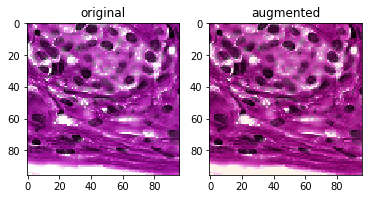

W0616 23:02:47.757838 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


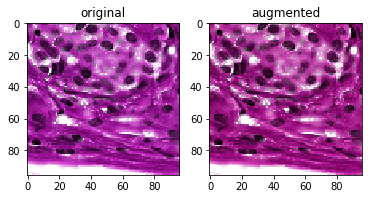

W0616 23:02:47.900344 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


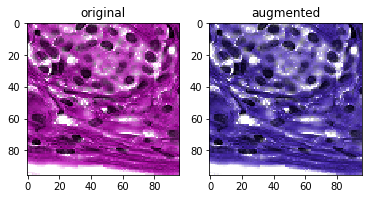

W0616 23:02:48.043957 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


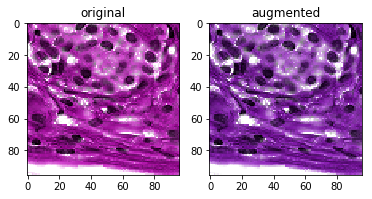

W0616 23:02:48.189149 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


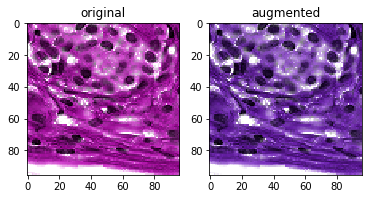

W0616 23:02:48.337506 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


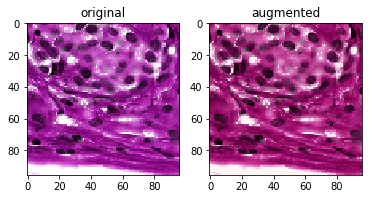

W0616 23:02:48.482899 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


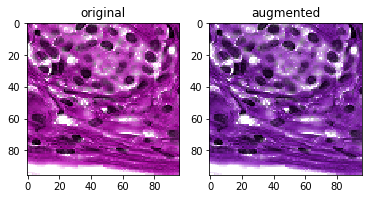

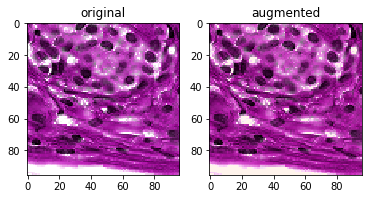

W0616 23:02:48.771964 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


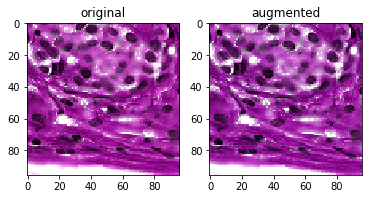

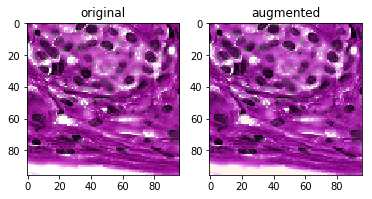

W0616 23:02:49.079279 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


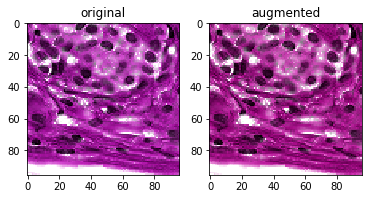

W0616 23:02:49.225090 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


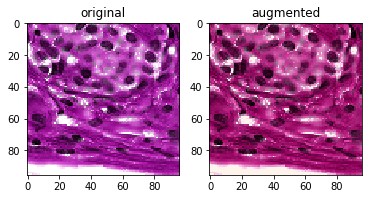

W0616 23:02:49.368479 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


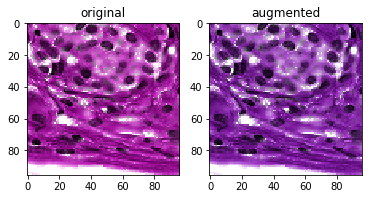

W0616 23:02:49.511363 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


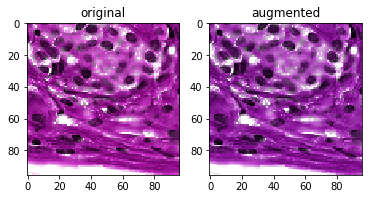

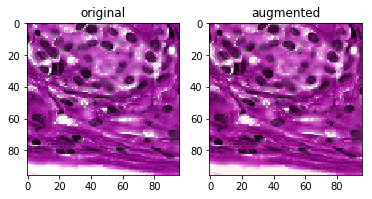

W0616 23:02:49.796967 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


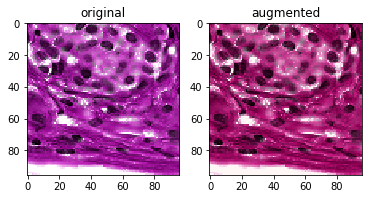

W0616 23:02:49.939585 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


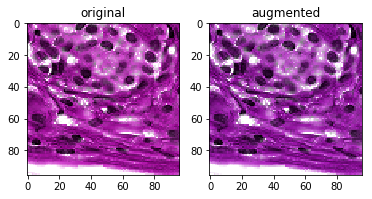

W0616 23:02:50.082006 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


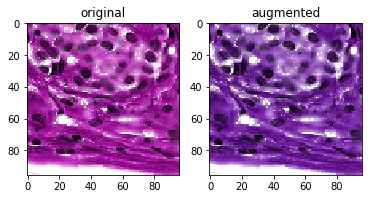

W0616 23:02:50.299641 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


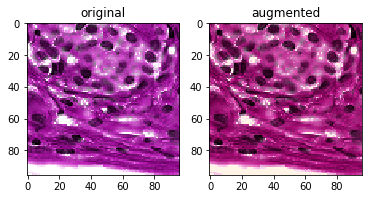

W0616 23:02:50.440350 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


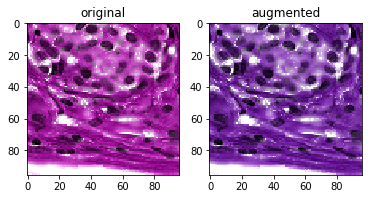

W0616 23:02:50.584472 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


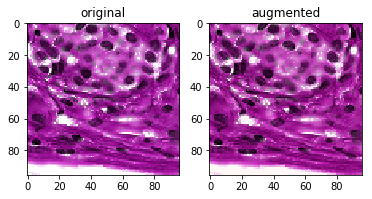

W0616 23:02:50.727469 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


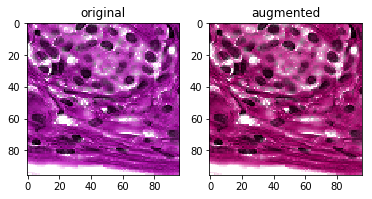

W0616 23:02:50.869773 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


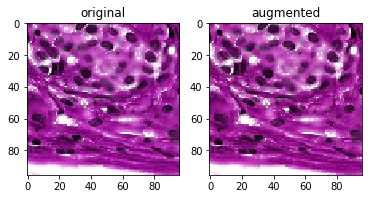

W0616 23:02:51.036872 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


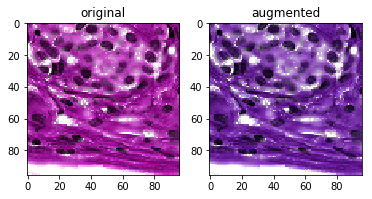

W0616 23:02:51.190760 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


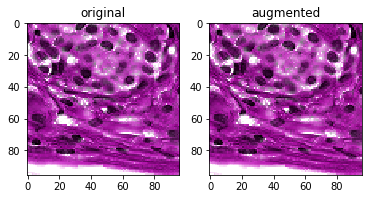

W0616 23:02:51.338420 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


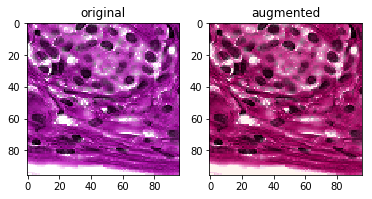

W0616 23:02:51.493122 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


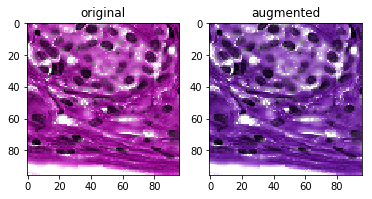

W0616 23:02:51.651176 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


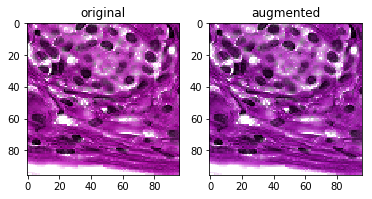

W0616 23:02:51.801970 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


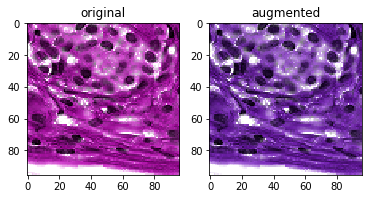

W0616 23:02:51.947242 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


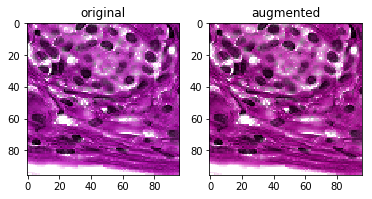

W0616 23:02:52.104915 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


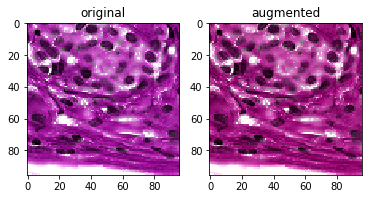

W0616 23:02:52.256528 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


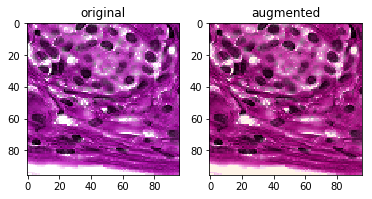

W0616 23:02:52.421271 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


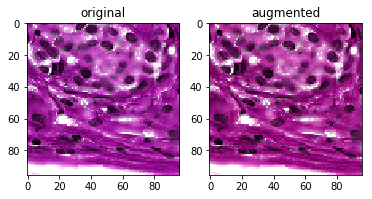

W0616 23:02:52.563269 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


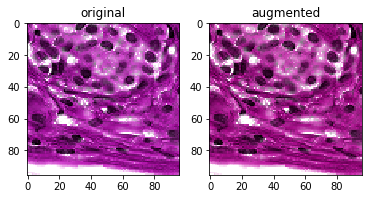

W0616 23:02:52.702691 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


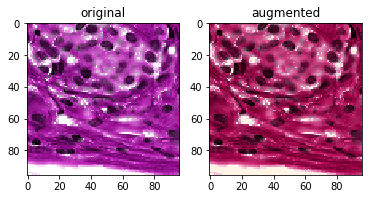

W0616 23:02:52.908473 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


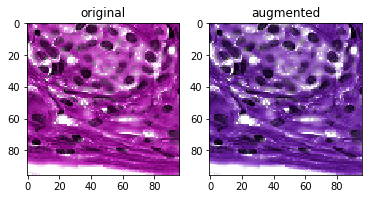

W0616 23:02:53.047576 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


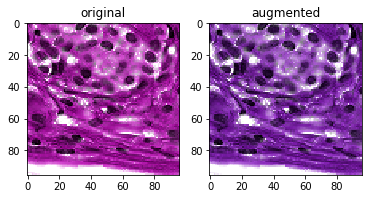

W0616 23:02:53.188111 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


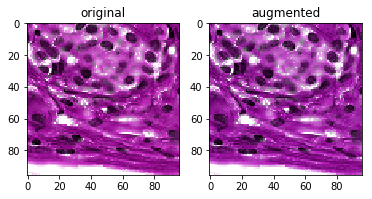

W0616 23:02:53.329307 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


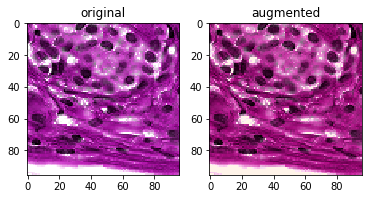

W0616 23:02:53.470037 140098971648128 image.py:656] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


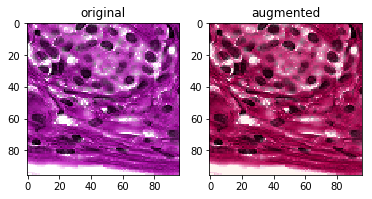

In [21]:
# test light
r = 0.1
image = x_test[1992]

for i in range(50):
    out = hsv_shifting(image, r)
    plt.figure()
    plt.subplot(121)
    plt.imshow(image)
    plt.title('original')
    plt.subplot(122)
    plt.imshow(out)
    plt.title('augmented')
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


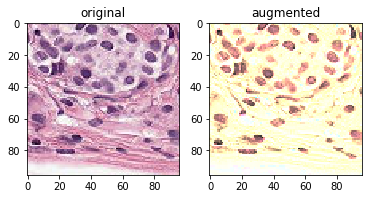

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


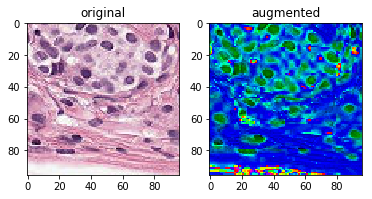

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


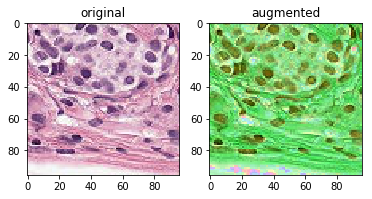

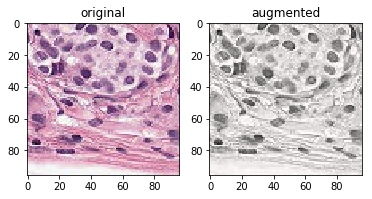

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


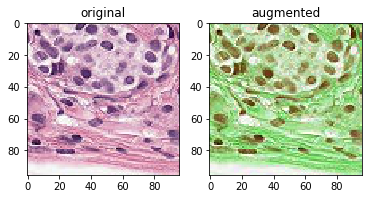

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


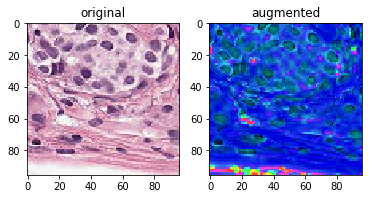

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


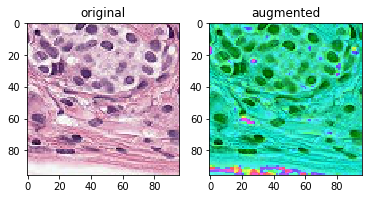

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


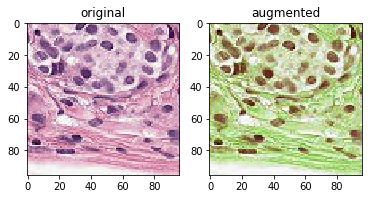

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


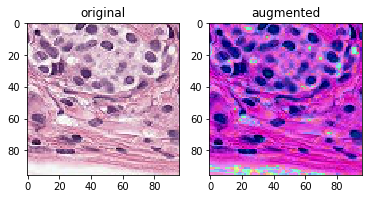

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


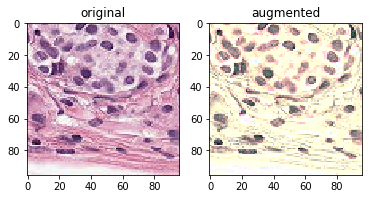

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


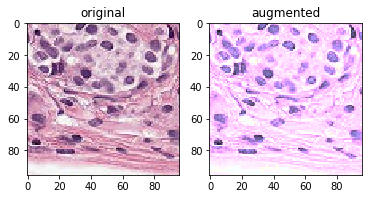

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


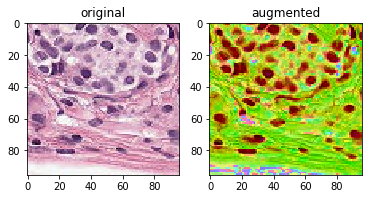

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


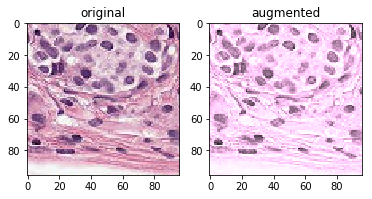

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


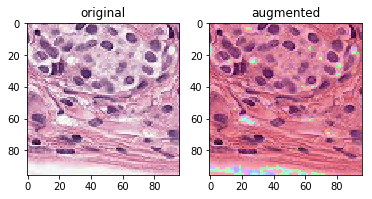

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


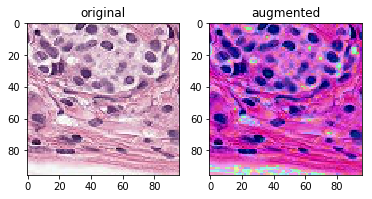

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


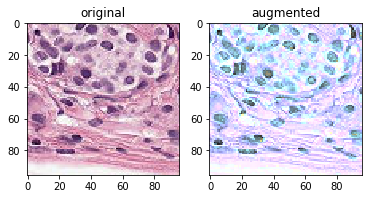

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


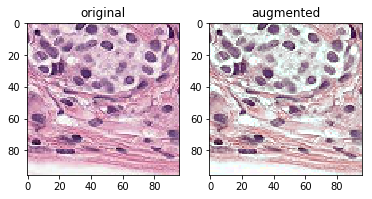

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


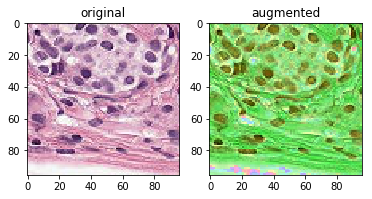

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


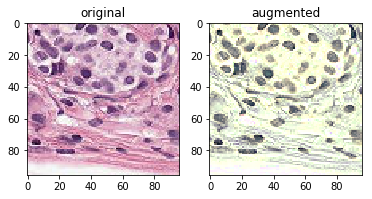

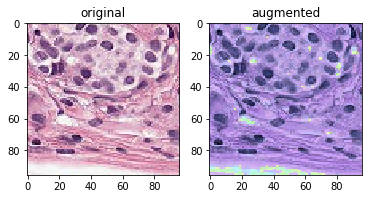

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


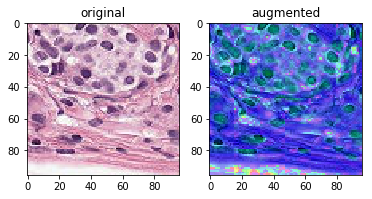

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


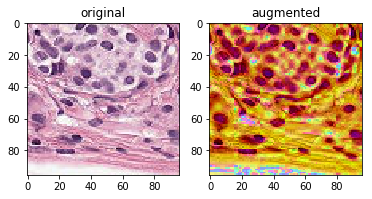

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


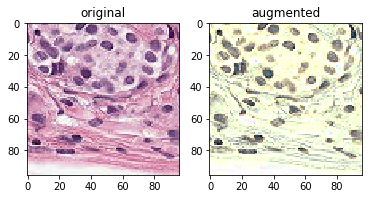

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


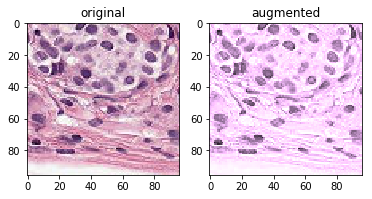

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


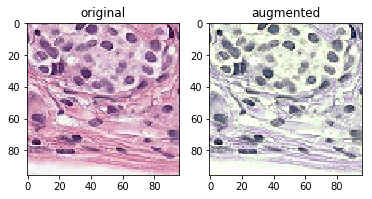

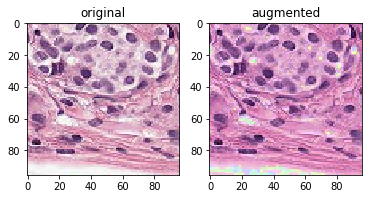

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


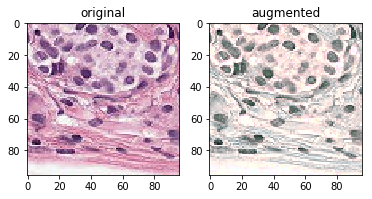

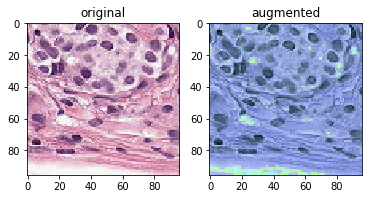

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


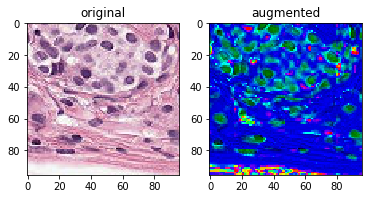

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


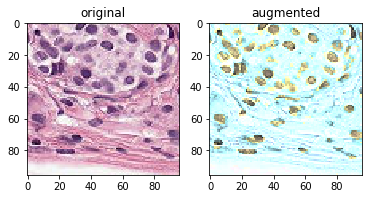

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


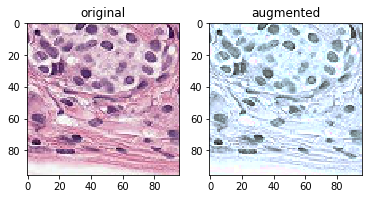

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


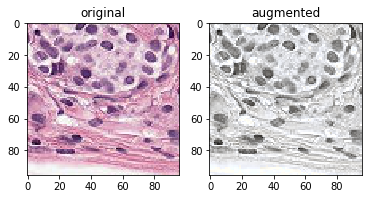

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


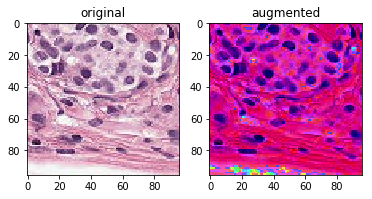

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


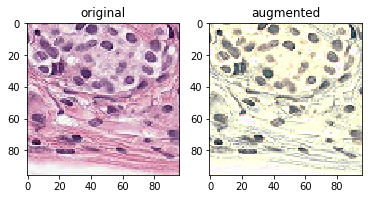

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


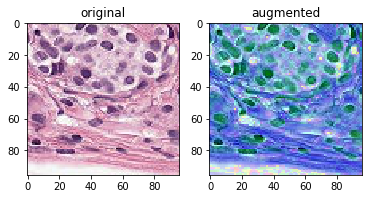

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


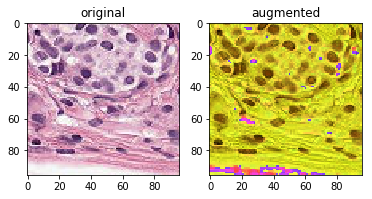

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


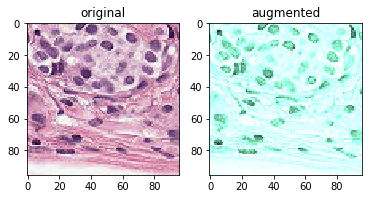

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


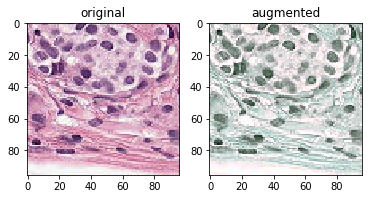

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


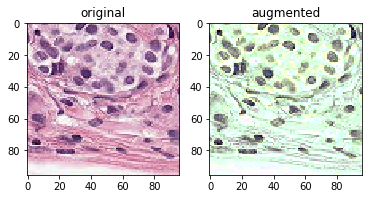

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


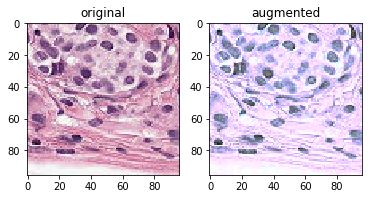

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


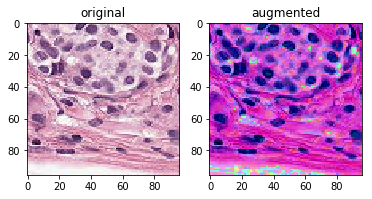

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


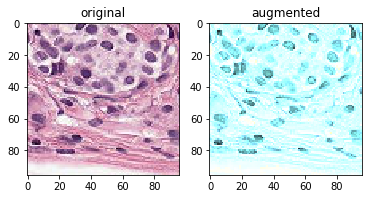

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


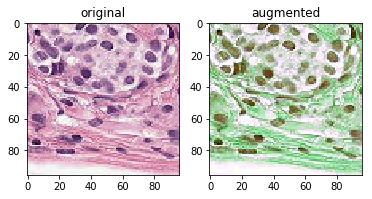

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


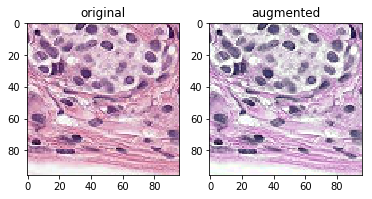

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


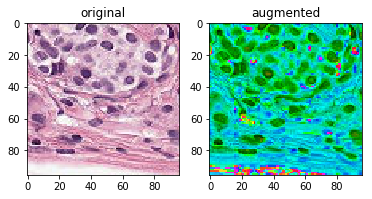

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


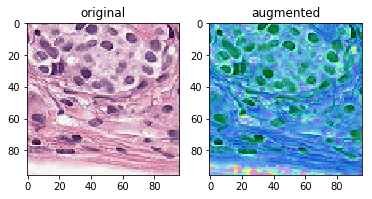

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


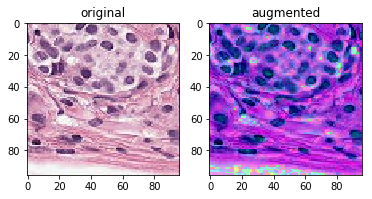

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


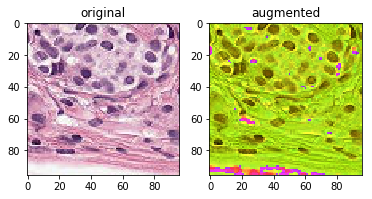

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


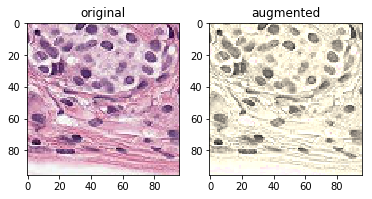

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


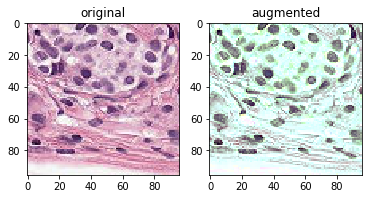

In [15]:
# test strong
r = 1
image = x_test[1992]

for i in range(50):
    out = hsv_shifting(image, r)
    plt.figure()
    plt.subplot(121)
    plt.imshow(image)
    plt.title('original')
    plt.subplot(122)
    plt.imshow(out)
    plt.title('augmented')
    plt.show()

## #HED

In [16]:
from skimage.color import rgb2hed, hed2rgb
from skimage.exposure import rescale_intensity

def hed_shifting(image, ratio):
    hed_im = rgb2hed(image)
    
    a = np.random.uniform(low= 1-ratio, high= 1+ratio, size=1)[0]
    b = np.random.uniform(low= -ratio, high= ratio, size=1)[0]
    
    hed_im[:,:,0] = a * hed_im[:,:,0] + b 
    hed_im[:,:,1] = a * hed_im[:,:,1] + b

    
    new_im = hed2rgb(hed_im)
    
    return new_im

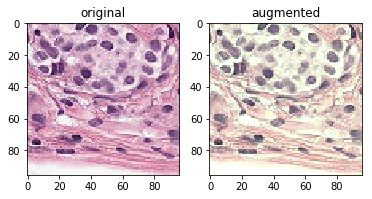

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


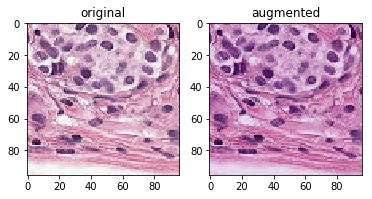

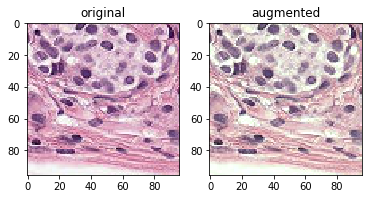

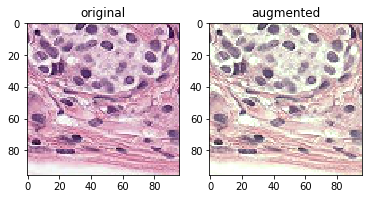

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


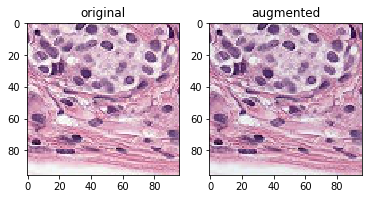

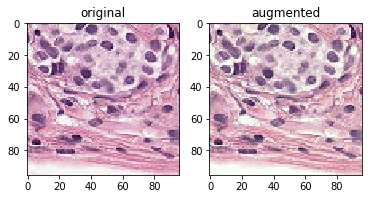

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


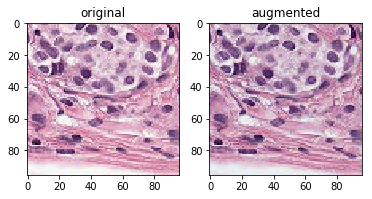

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


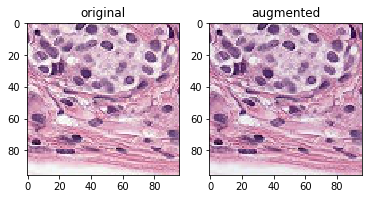

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


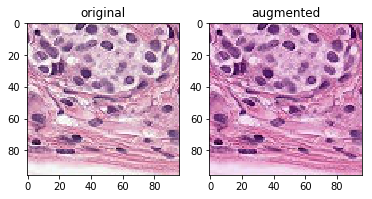

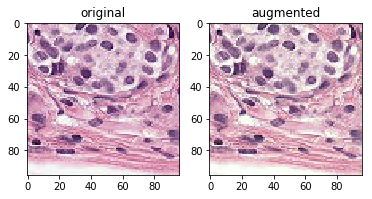

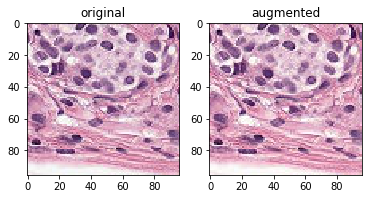

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


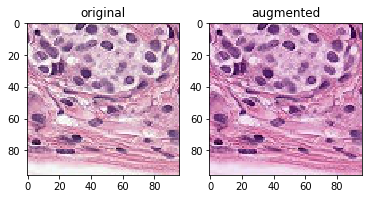

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


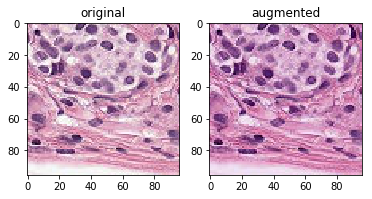

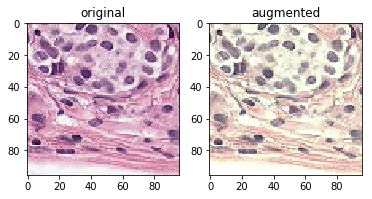

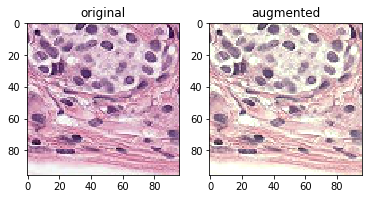

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


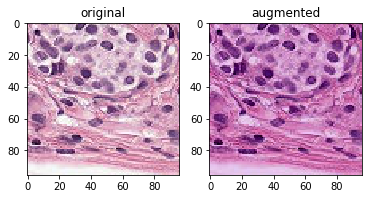

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


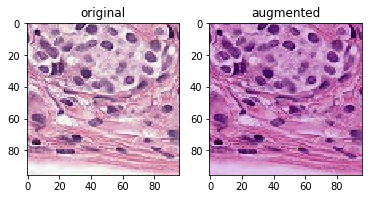

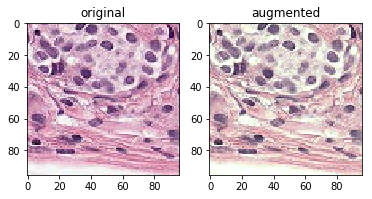

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


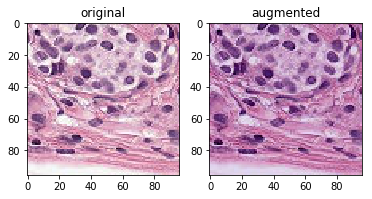

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


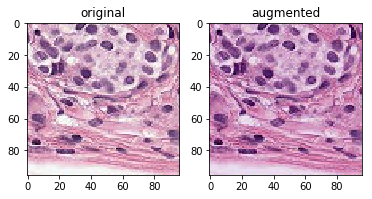

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


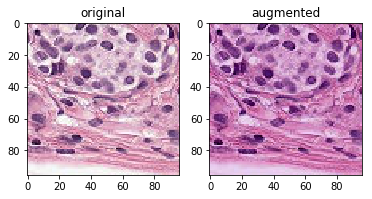

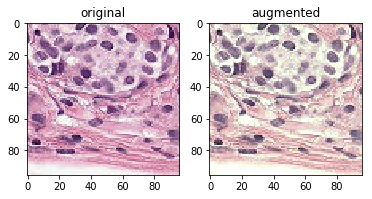

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


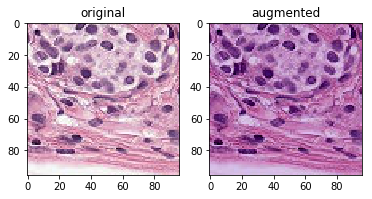

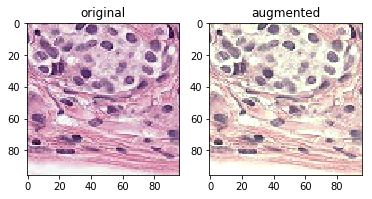

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


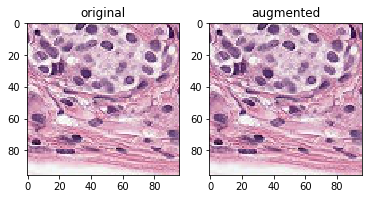

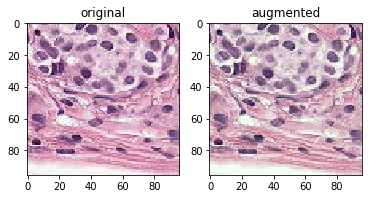

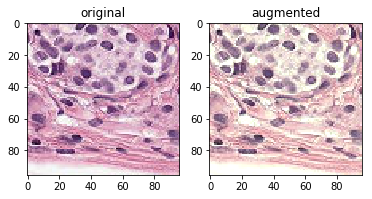

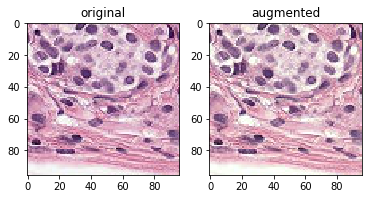

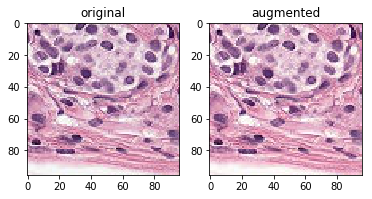

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


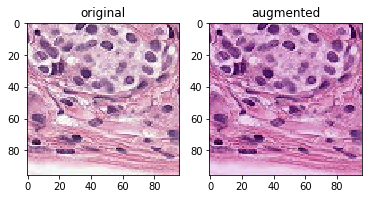

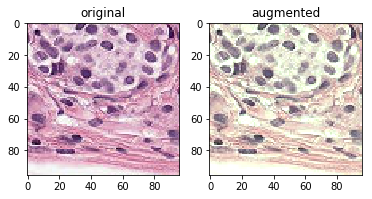

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


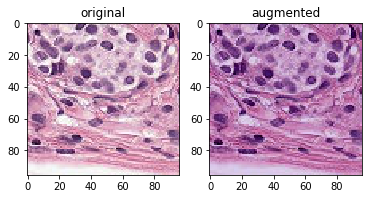

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


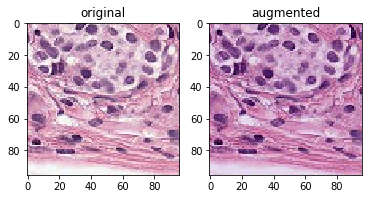

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


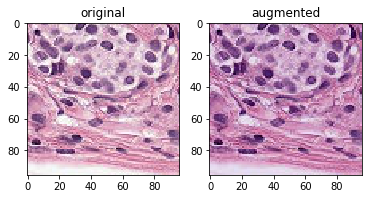

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


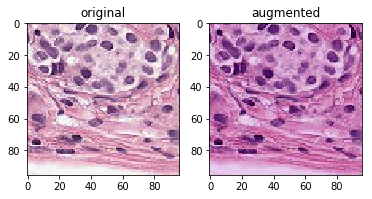

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


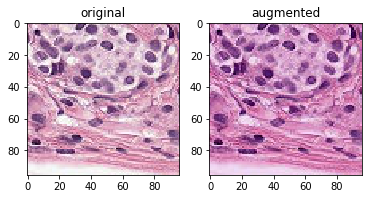

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


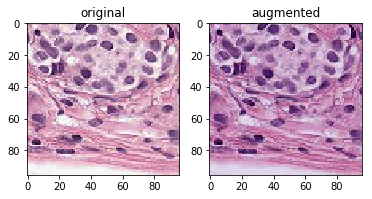

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


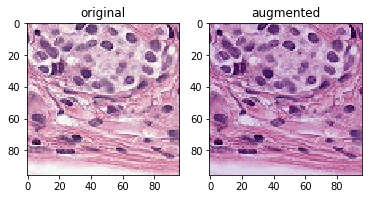

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


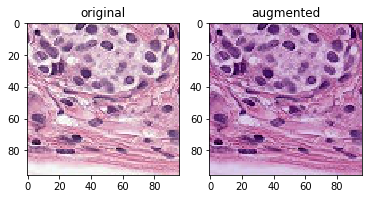

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


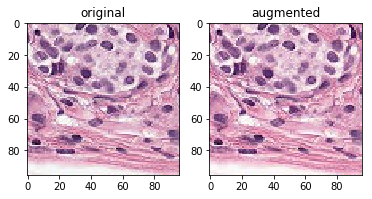

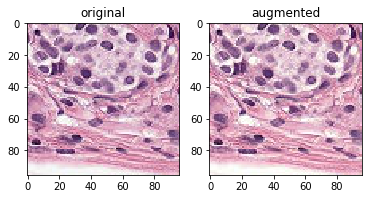

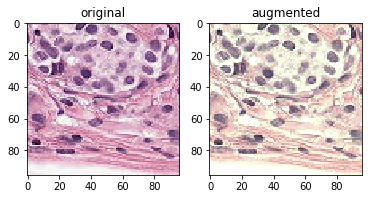

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


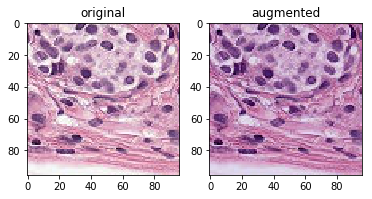

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


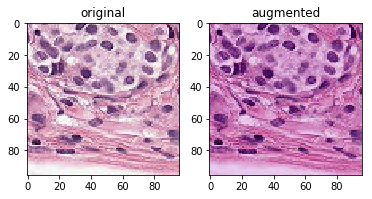

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


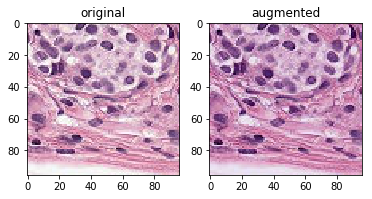

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


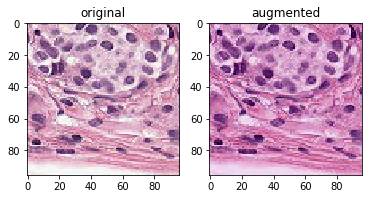

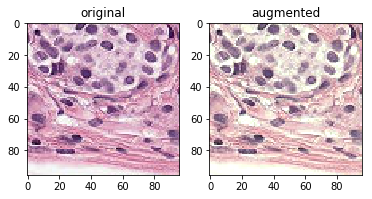

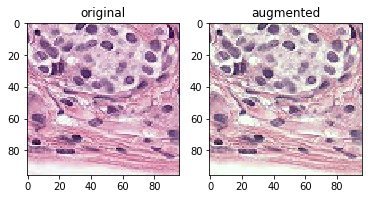

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


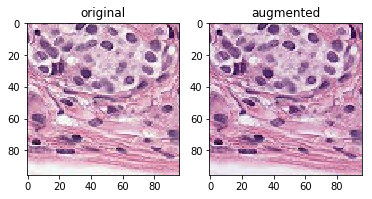

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


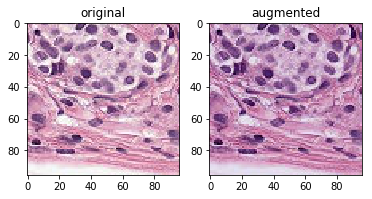

In [17]:
# test light

r = 0.02
image = x_test[1992]

for i in range(50):
    out = hed_shifting(image, r)
    plt.figure()
    plt.subplot(121)
    plt.imshow(image)
    plt.title('original')
    plt.subplot(122)
    plt.imshow(out)
    plt.title('augmented')
    plt.show()

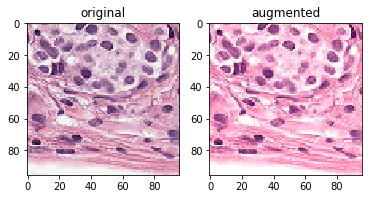

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


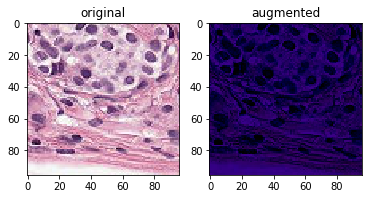

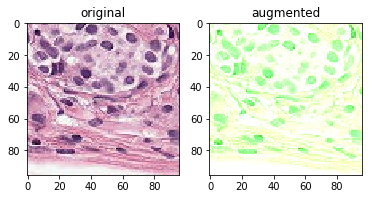

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


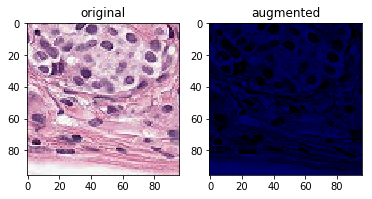

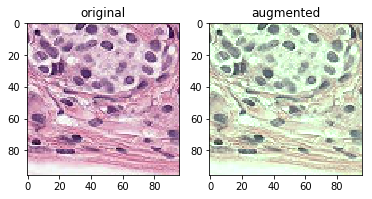

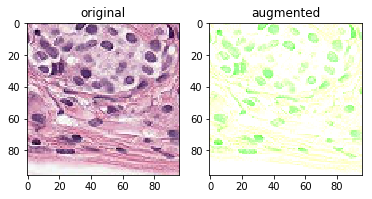

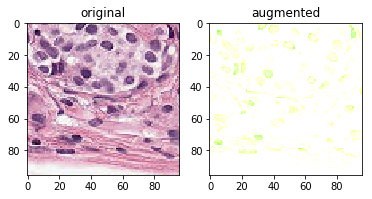

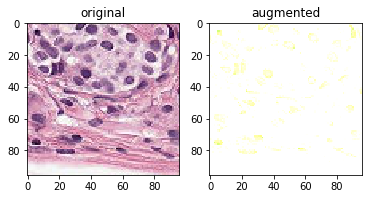

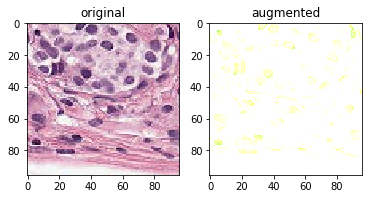

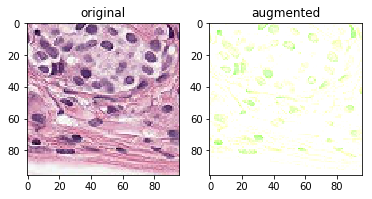

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


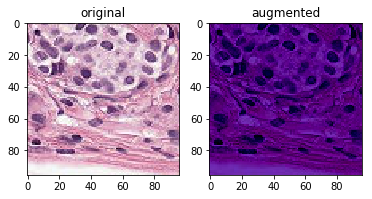

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


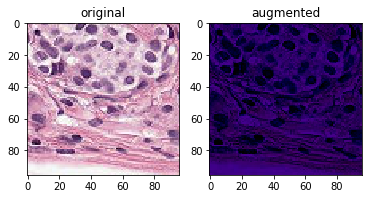

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


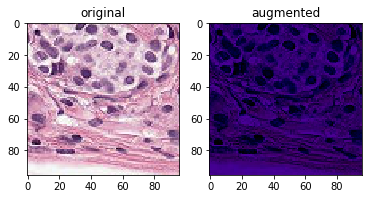

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


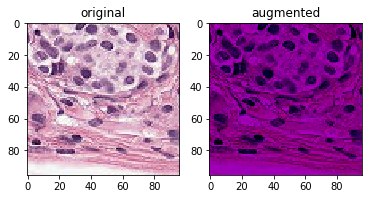

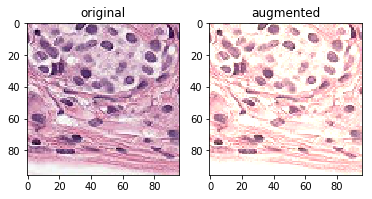

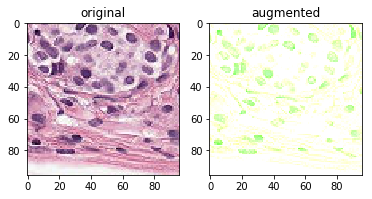

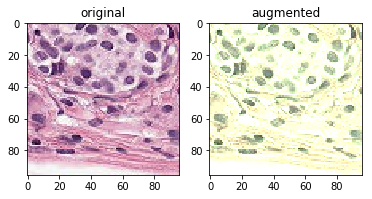

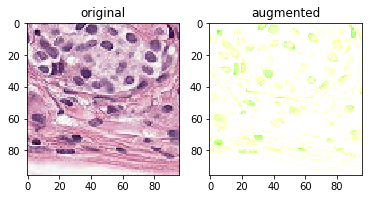

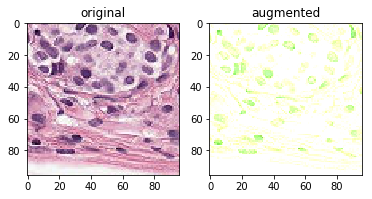

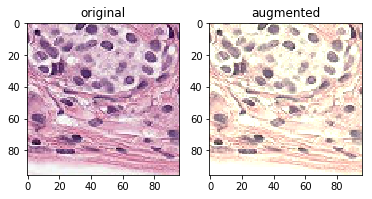

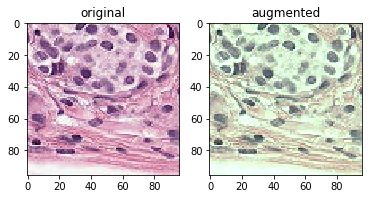

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


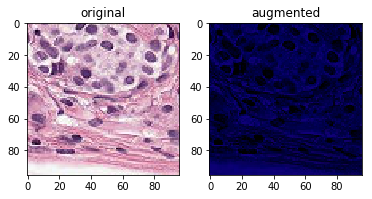

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


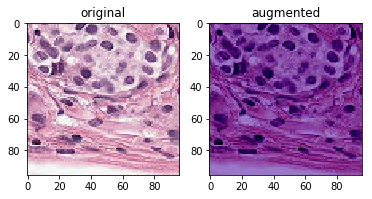

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


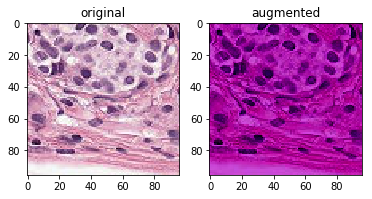

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


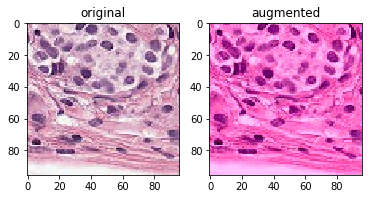

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


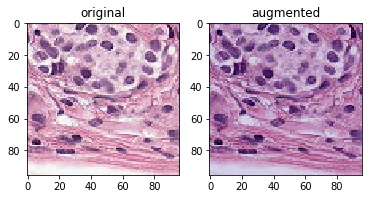

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


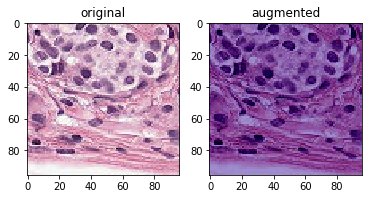

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


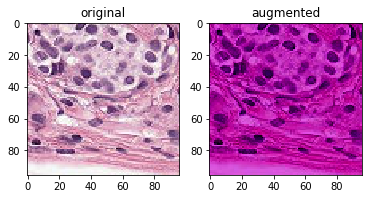

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


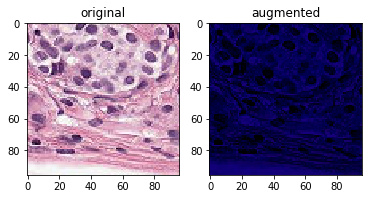

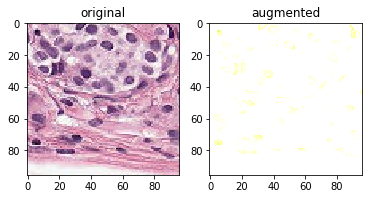

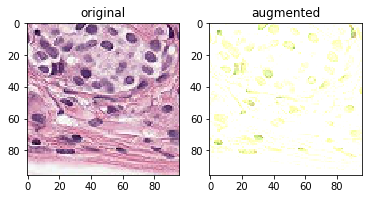

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


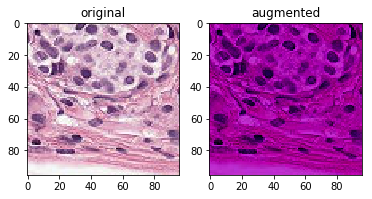

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


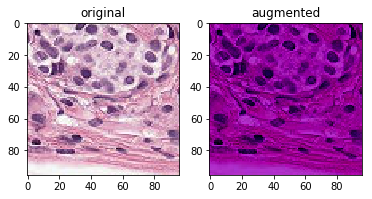

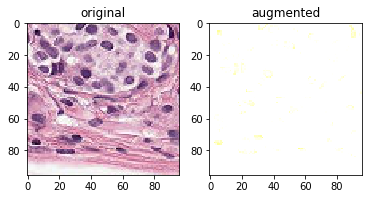

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


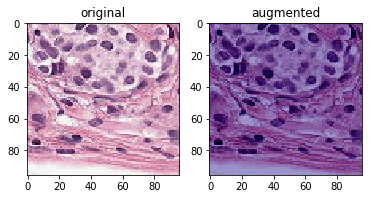

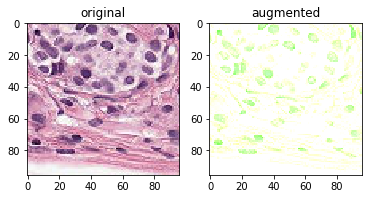

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


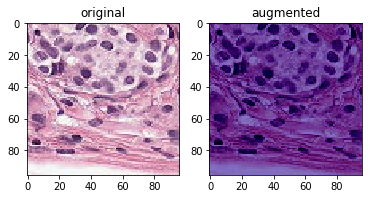

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


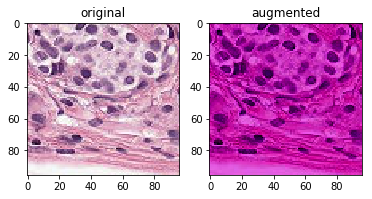

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


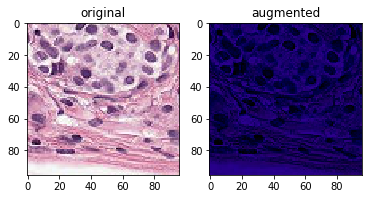

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


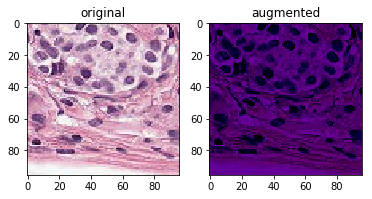

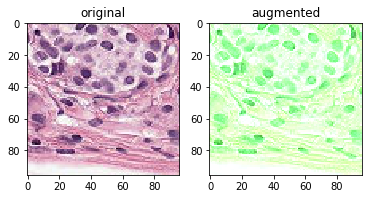

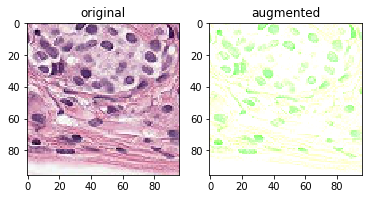

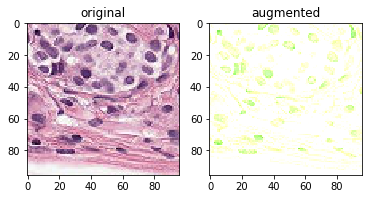

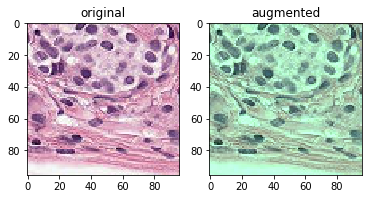

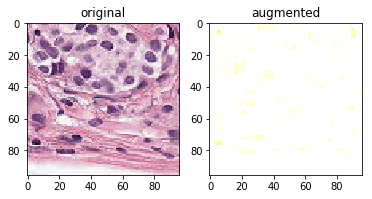

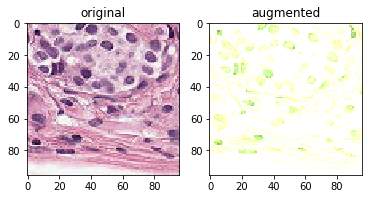

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


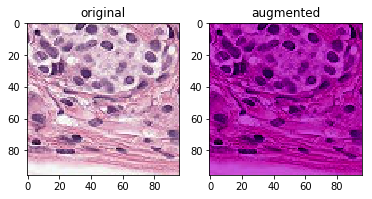

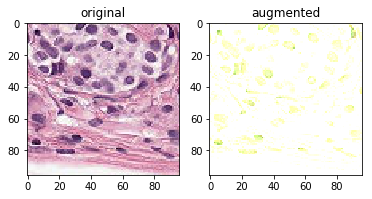

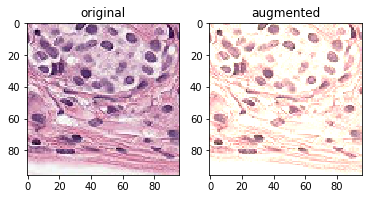

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


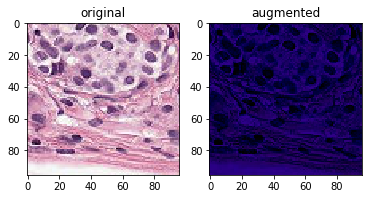

In [18]:
# test strong

r = 0.2
image = x_test[1992]

for i in range(50):
    out = hed_shifting(image, r)
    plt.figure()
    plt.subplot(121)
    plt.imshow(image)
    plt.title('original')
    plt.subplot(122)
    plt.imshow(out)
    plt.title('augmented')
    plt.show()

___________________________________

## Augmentation 

In [19]:
def Augmentation(image, rot=[0, 90], elast_a=[80, 120], elast_sig=[9.0 , 11.0], g_noise=[0,0.1],
                g_blurr=[0,0.1], brigh=[0.65,1.35], contr=[0.5,1.5], HSV=0.1, HED=0.02):
    
    
    
    #### Group 1: Basic -> Rotation or Mirroring ###    
    if random.getrandbits(1) > 0:
        # random rotation
        im = Image.fromarray(image)
        angle = sample(rot, 1)        
        im = im.rotate(angle[0])
        im = np.array(im)
    else:
        # random mirroring
        im = mirroring(image)
    
    #### Group 2: Morphologic -> Elestic deformation,  gaussian noise or gaussian blurring ####
    t = random.getrandbits(2)
    if t == 0:
        # random elastic trasform
        a = np.random.uniform(low=elast_a[0], high=elast_a[1], size=1)[0]
        s = np.random.uniform(low=elast_sig[0], high=elast_sig[1], size=1)[0]
        im = elastic_transform(im, a, s)
    elif t == 1:
        # random gaussian noise
        sigma = np.random.uniform(low=g_noise[0], high=g_noise[1], size=1)[0]
        im = gaussian_noise(im, sigma)
    elif t == 2:
        # random gaussian blurring
        sigma = np.random.uniform(low=g_blurr[0], high=g_blurr[1], size=1)[0]
        im = Image.fromarray(im)
        im = im.filter(ImageFilter.GaussianBlur(sigma))
        im = np.array(im)
        
    #### Group 3: Brightness or Contrast ####
    if random.getrandbits(1) > 0:
        # random brightness perturbation
        br = np.random.uniform(low=brigh[0], high=brigh[1], size=1)[0]
        im = Image.fromarray(im)
        im = ImageEnhance.Brightness(im)
        im = im.enhance(br)
        im = np.array(im)
    else:
        # random contrast perturbation
        cr = np.random.uniform(low=contr[0], high=contr[1], size=1)[0]
        im = Image.fromarray(im)
        im = ImageEnhance.Contrast(im)
        im = im.enhance(cr)
        im = np.array(im)
    
    return im

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

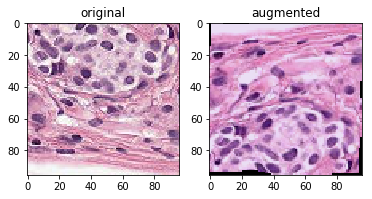

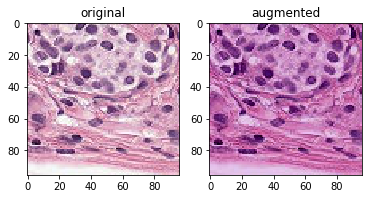

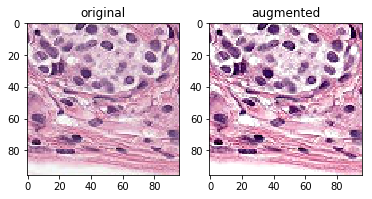

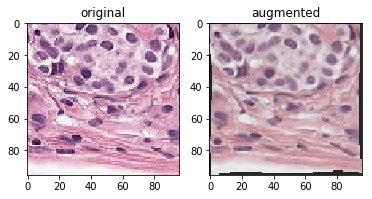

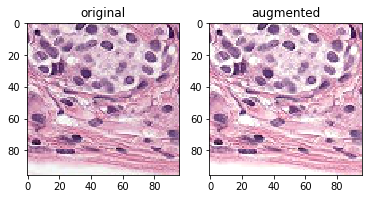

...

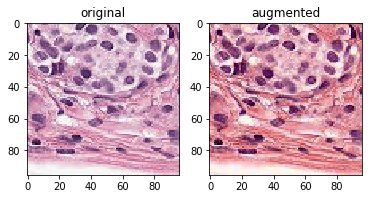

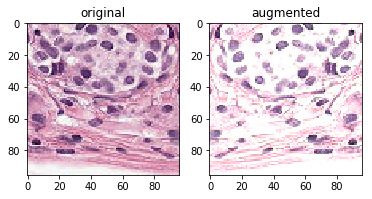

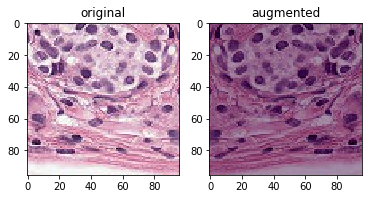

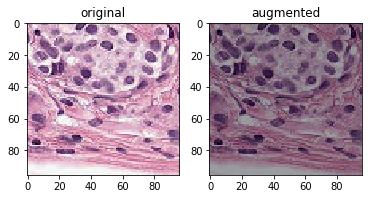

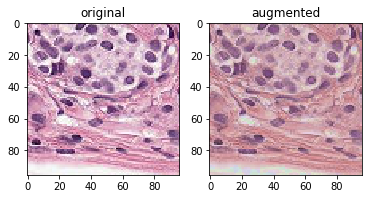

In [20]:
for i in range(20):
    plt.figure()
    plt.subplot(121)
    plt.imshow(image)
    plt.title('original')
    plt.subplot(122)
    aug = Augmentation(image)
    plt.imshow(aug)
    plt.title('augmented')
plt.show()

## Usage in DataGenerator

In [21]:
class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, data, labels, batch_size=32, dim=(224, 224), n_channels=3,
                 n_classes=2, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.data = data
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, self.n_classes))

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # preprocessing
            img_arr = self.data[ID]
            img = array_to_img(img_arr)
            img = img.resize((224,224), Image.ANTIALIAS)
            img.load()
            
            X[i] = Augmentation(np.asarray(img, dtype=np.uint8))

            # Store target label(one-hot-encoding)
            y[i] = to_categorical(self.labels[str(ID)], num_classes=self.n_classes)

        return X, y